To visualize candlestick data you have two main options:
- Lineplot: you can directly plot the timeseries of closing prices. Although this is the most straightforward
approach, it is just a simplified visualization, as it does not represent any information regarding
Highs/Lows;
- Candlestick plot: it is possible to represent directly candlestick plots by means of mplfinance or Plotly. A
template with mplfinance follows:

# Mpfinance

## Plot function

In [214]:
import os
import matplotlib.pyplot as plt
import mplfinance as mpf
import pandas as pd

def print_OHLC(start_time, end_time, data, PNG_DIRECTORY, figname='trades.png'):
    # Ensure the index is a DatetimeIndex
    if not isinstance(data.index, pd.DatetimeIndex):
        # Correct the datetime format to match the dataset format
        data['datetime'] = pd.to_datetime(data['Date'].astype(str) + ' ' + data['Time'].astype(str), format='%Y.%m.%d %H:%M:%S')
        data.set_index('datetime', inplace=True)

    # Create the directory if it doesn't exist
    if not os.path.exists(PNG_DIRECTORY):
        os.makedirs(PNG_DIRECTORY)
    else:
        # Clear the directory of existing files, excluding hidden/system files
        for file in os.listdir(PNG_DIRECTORY):
            file_path = os.path.join(PNG_DIRECTORY, file)
            # Skip hidden files and directories (e.g., .ipynb_checkpoints)
            if not file.startswith('.') and os.path.isfile(file_path):
                os.remove(file_path)

    # Convert start_time and end_time to datetime if they are not already in datetime format
    start_time = pd.to_datetime(start_time)
    end_time = pd.to_datetime(end_time)
    
    # Create the figure and axis
    fig = mpf.figure(style='yahoo', figsize=(15, 10))
    ax = fig.add_subplot(1, 1, 1)
    
    # Select OHLC data for the specified time range
    ohlc_data_temp = data.loc[(data.index >= start_time) & (data.index <= end_time)].copy()
    ohlc_data = ohlc_data_temp[['Open', 'High', 'Low', 'Close', 'Volume']].copy()
    
    # Prepare Heikin-Ashi data
    ha_data = ohlc_data_temp[['HA_open', 'HA_high', 'HA_low', 'HA_close']].copy().rename(
        columns={
            'HA_open': 'Open',
            'HA_high': 'High',
            'HA_low': 'Low',
            'HA_close': 'Close'
        }
    )
    
    # Add Heikin-Ashi plot as an additional plot
    addplot = [
        mpf.make_addplot(ha_data, type='candle', secondary_y=False, ax=ax),
    ]
    
    # Plot the data
    mpf.plot(ohlc_data, type='ohlc', volume=False, returnfig=True, ylabel='', ax=ax, addplot=addplot)
    
    # Adjust layout and save the figure
    fig.tight_layout()
    fig.savefig(os.path.join(PNG_DIRECTORY, figname))
    plt.close(fig)


In [215]:
#Second version (plots instead than saving on file):
import matplotlib.pyplot as plt
import mplfinance as mpf
import pandas as pd

def plot_OHLC(start_time, end_time, data):
    # Ensure the index is a DatetimeIndex
    if not isinstance(data.index, pd.DatetimeIndex):
        # Correct the datetime format to match the dataset format
        data['datetime'] = pd.to_datetime(data['Date'].astype(str) + ' ' + data['Time'].astype(str), format='%Y.%m.%d %H:%M:%S')
        data.set_index('datetime', inplace=True)

    # Convert start_time and end_time to datetime if they are not already in datetime format
    start_time = pd.to_datetime(start_time)
    end_time = pd.to_datetime(end_time)
    
    # Create the figure and axis
    fig = mpf.figure(style='yahoo', figsize=(15, 10))
    ax = fig.add_subplot(1, 1, 1)
    
    # Select OHLC data for the specified time range
    ohlc_data_temp = data.loc[(data.index >= start_time) & (data.index <= end_time)].copy()
    ohlc_data = ohlc_data_temp[['Open', 'High', 'Low', 'Close', 'Volume']].copy()
    
    # Prepare Heikin-Ashi data
    ha_data = ohlc_data_temp[['HA_open', 'HA_high', 'HA_low', 'HA_close']].copy().rename(
        columns={
            'HA_open': 'Open',
            'HA_high': 'High',
            'HA_low': 'Low',
            'HA_close': 'Close'
        }
    )
    
    # Add Heikin-Ashi plot as an additional plot
    addplot = [
        mpf.make_addplot(ha_data, type='candle', secondary_y=False, ax=ax),
    ]
    
    # Plot the data
    mpf.plot(ohlc_data, type='ohlc', volume=False, ylabel='', ax=ax, addplot=addplot)
    
    # Adjust layout and show the figure
    fig.tight_layout()
    plt.show()

In [232]:
#Fird version: make two plots at the same time
import matplotlib.pyplot as plt
import mplfinance as mpf
import pandas as pd

def plot_OHLC_two_datasets(start_time, end_time, data1, data2):
    # Ensure the indices of both datasets are DatetimeIndex
    if not isinstance(data1.index, pd.DatetimeIndex):
        data1['datetime'] = pd.to_datetime(data1['Date'].astype(str) + ' ' + data1['Time'].astype(str), format='%Y.%m.%d %H:%M:%S')
        data1.set_index('datetime', inplace=True)

    if not isinstance(data2.index, pd.DatetimeIndex):
        data2['datetime'] = pd.to_datetime(data2['Date'].astype(str) + ' ' + data2['Time'].astype(str), format='%Y.%m.%d %H:%M:%S')
        data2.set_index('datetime', inplace=True)

    # Convert start_time and end_time to datetime if not already
    start_time = pd.to_datetime(start_time)
    end_time = pd.to_datetime(end_time)
    
    # Filter both datasets based on the time window
    ohlc_data1 = data1.loc[(data1.index >= start_time) & (data1.index <= end_time)].copy()
    ohlc_data2 = data2.loc[(data2.index >= start_time) & (data2.index <= end_time)].copy()

    # Prepare data for overlay
    addplot = [
        mpf.make_addplot(ohlc_data2[['Open', 'High', 'Low', 'Close']].rename(columns={
            'Open': 'Second_Open', 'High': 'Second_High', 'Low': 'Second_Low', 'Close': 'Second_Close'
        }), type='candle', ylabel='Dataset 2', secondary_y=False)
    ]

    # Create the combined plot
    mpf.plot(
        ohlc_data1[['Open', 'High', 'Low', 'Close']],
        type='candle',
        style='yahoo',
        addplot=addplot,
        title="Overlay of Two Datasets",
        ylabel='Dataset 1',
        figsize=(15, 10)
    )

# Example usage:
# Assuming `df` and `df_copy` are pandas DataFrames with the required columns and datetime indices
# plot_OHLC_two_datasets('2023-01-01 09:00:00', '2023-01-02 17:00:00', df, df)

## Process Dataset

In [217]:
import pandas as pd

#importing
#df=pd.read_csv("data_M15/DAX_M15_202005242300_202411131015.csv",sep="\t")
df=pd.read_csv("data_M15/DJ_M15_202009240845_202411131015.csv",sep="\t")

#Renaming columns
df.rename(
    columns={
        '<DATE>': 'Date',
        '<TIME>': 'Time',
        '<VOL>': 'Vol',
        '<SPREAD>': 'Spread',
        '<OPEN>': 'Open',
        '<HIGH>': 'High',
        '<LOW>': 'Low',
        '<CLOSE>': 'Close',
        '<TICKVOL>': 'Volume'
    },
    inplace=True
)


# Combine the date and <TIME> columns to create a datetime column
df['datetime'] = pd.to_datetime(df['Date'].astype(str) + ' ' + df['Time'].astype(str), format='%Y.%m.%d %H:%M:%S')

A useful way to visualize trends is by mean of Heiken-Ashi candlesticks. Heiken Ashi (HA) is
a modified candlestick charting technique used in technical analysis to smooth out price action and highlight
trends more clearly. It modifies the traditional Open, High, Low, Close (OHLC) data with a specific formula,
creating a visual representation that filters out some market noise.

In [218]:
#Calculating the Heiken Ashi (HA) values: 

# Step 1: Calculate HA_Close
df['HA_Close'] = (df['Open'] + df['High'] + df['Low'] + df['Close']) / 4

# Step 2: Initialize HA_Open with the correct data type
df['HA_Open'] = 0.0
df.loc[0, 'HA_Open'] = df.loc[0, 'Open']  # First value is the standard Open

# Step 3: Calculate HA_Open for subsequent rows
for t in range(1, len(df)):
    df.loc[t, 'HA_Open'] = (df.loc[t - 1, 'HA_Open'] + df.loc[t - 1, 'HA_Close']) / 2

# Step 4: Calculate HA_High and HA_Low
df['HA_High'] = df[['High', 'HA_Open', 'HA_Close']].max(axis=1)
df['HA_Low'] = df[['Low', 'HA_Open', 'HA_Close']].min(axis=1)

# Rename the columns for compatibility with the function
df.rename(
    columns={
        'HA_Open': 'HA_open',
        'HA_Close': 'HA_close',
        'HA_High': 'HA_high',
        'HA_Low': 'HA_low'
    },
    inplace=True
)

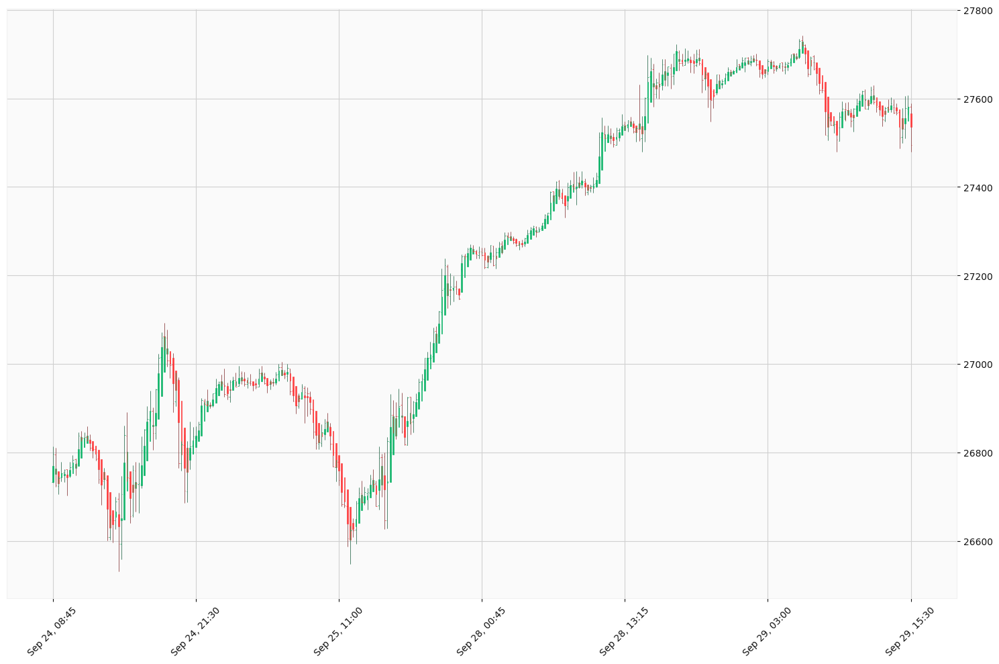

In [227]:
# Now you can call the plot function with the correct datetime index
start_t = pd.to_datetime(
    df['Date'].iloc[0] + ' ' + df['Time'].iloc[0], 
    format='%Y.%m.%d %H:%M:%S'
)
end_t = pd.to_datetime(
    df['Date'].iloc[300] + ' ' + df['Time'].iloc[300], 
    format='%Y.%m.%d %H:%M:%S'
) 


# Set the datetime column as the index of the DataFrame
#df.set_index('datetime', inplace=True)
#plot_OHLC(start_t, end_t, df, "Fig")
plot_OHLC(start_t, end_t, df)

# Plotly

In [220]:
import plotly.graph_objects as go

import pandas as pd
from datetime import datetime


# Define the date range
start_t = pd.to_datetime(
    df['Date'].iloc[0] + ' ' + df['Time'].iloc[0], 
    format='%Y.%m.%d %H:%M:%S'
)
end_t = pd.to_datetime(
    df['Date'].iloc[500] + ' ' + df['Time'].iloc[-1], 
    format='%Y.%m.%d %H:%M:%S'
) 

# Filter the DataFrame for the specified date range
filtered_df = df.loc[start_t:end_t]


# Create the candlestick chart
fig = go.Figure(data=[go.Candlestick(
    x=filtered_df['Date'],
    open=filtered_df['HA_open'],
    high=filtered_df['HA_high'],
    low=filtered_df['HA_low'],
    close=filtered_df['HA_close']
)])


fig.show()

In [221]:
import plotly.graph_objects as go
import pandas as pd
from datetime import datetime

# Define the date range
start_t = pd.to_datetime(
    df['Date'].iloc[0] + ' ' + df['Time'].iloc[0], 
    format='%Y.%m.%d %H:%M:%S'
)
end_t = pd.to_datetime(
    df['Date'].iloc[-1] + ' ' + df['Time'].iloc[-1], 
    format='%Y.%m.%d %H:%M:%S'
) 

# Combine Date and Time into a datetime column if not already done
df['datetime'] = pd.to_datetime(
    df['Date'].astype(str) + ' ' + df['Time'].astype(str), 
    format='%Y.%m.%d %H:%M:%S'
)

# Filter the DataFrame for the specified date range
filtered_df = df[(df['datetime'] >= start_t) & (df['datetime'] <= end_t)]

# Create the candlestick chart
fig = go.Figure(data=[go.Candlestick(
    x=filtered_df['datetime'],  # Use datetime for x-axis
    open=filtered_df['HA_open'],
    high=filtered_df['HA_high'],
    low=filtered_df['HA_low'],
    close=filtered_df['HA_close']
)])

# Update the layout to show minutes on the x-axis
fig.update_layout(
    xaxis=dict(
        title='Time',
        tickformat='%H:%M',  # Format for hours and minutes
        rangeslider=dict(visible=False)  # Optional: hide the range slider
    ),
    title='Candlestick Chart with Minute Resolution',
)

fig.show()


# Calculate the moving average

In [222]:
import pandas as pd

def calculate_rolling_mean_and_subtract(df, price_column, period):
    """
    Calculate the rolling mean for a specified time period and subtract it from the asset's price.

    Parameters:
    - df: pd.DataFrame - The DataFrame containing the asset data.
    - price_column: str - The name of the column with the asset's price (e.g., 'Close').
    - period: int - The rolling window size (number of periods for the rolling mean).

    Returns:
    - pd.DataFrame - A copy of the DataFrame with a new column for the adjusted price.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()

    # Calculate the rolling mean
    rolling_mean = df_copy[price_column].rolling(window=period).mean()

    # Subtract the rolling mean from the price
    df_copy[f'{price_column}_adjusted'] = df_copy[price_column] - rolling_mean

    return df_copy

# Assuming the DataFrame is called `df` and you want to calculate the rolling mean for 50 periods:
df_adjusted = calculate_rolling_mean_and_subtract(df, price_column='Close', period=2)

# Display the first few rows with the new adjusted column
print(df_adjusted[['Close', 'Close_adjusted']].head())

                       Close  Close_adjusted
datetime                                    
2020-09-24 08:45:00  26796.9             NaN
2020-09-24 09:00:00  26726.3           -35.3
2020-09-24 09:15:00  26742.3             8.0
2020-09-24 09:30:00  26752.3             5.0
2020-09-24 09:45:00  26760.3             4.0


In [229]:
import pandas as pd

def adjust_columns_with_rolling_mean(df, period_in_days, rows_per_day):
    """
    Adjust specified columns of a DataFrame by subtracting their rolling mean.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    period_in_days (int): The desired rolling period in days.
    rows_per_day (int): The number of rows representing one day in the DataFrame.

    Returns:
    pd.DataFrame: A new DataFrame with adjusted columns.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()

    # Calculate the rolling period in rows
    period = period_in_days * rows_per_day

    # Columns to adjust (index 4 to 13)
    columns_to_adjust = df_copy.columns[4:13]

    # Subtract rolling mean from each specified column
    for col in columns_to_adjust:
        # Calculate the rolling mean for the column
        rolling_mean = df_copy[col].rolling(window=period).mean()
        
        # Replace initial NaN values in the rolling mean with 0
        rolling_mean.fillna(0, inplace=True)
        
        # Subtract the rolling mean from the column
        df_copy[col] -= rolling_mean

    return df_copy

# Determine the number of rows per day
rows_per_day = 96  # Assuming 15-minute intervals for 24 hours

df_copy=adjust_columns_with_rolling_mean(df,100,96)

AttributeError: 'NoneType' object has no attribute 'suptitle'

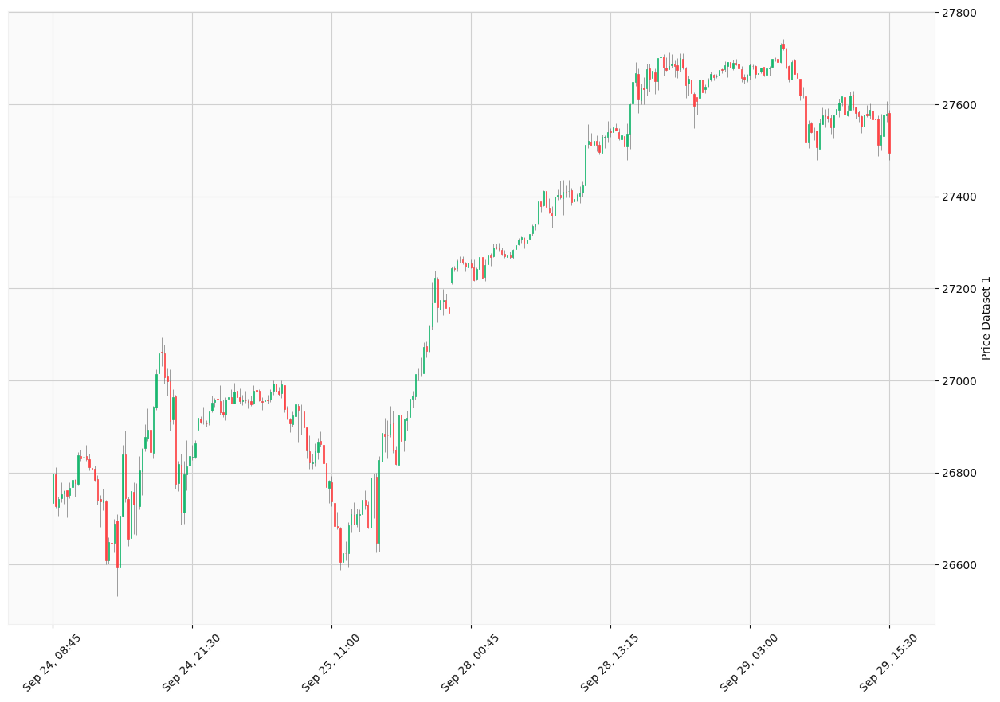

In [233]:
plot_OHLC_two_datasets(start_t, end_t, df,df)

# Raw Mean reversion metric

# Hurst exponent

## Hurst Exponent

The **Hurst Exponent** (H) measures the tendency of a time series to either:

- **Persist in a trend** (H > 0.5): This indicates a trending time series, where values are likely to continue in the same direction.
- **Exhibit randomness** (H ≈ 0.5): This suggests that the time series behaves like a random walk.
- **Mean-revert** (H < 0.5): This indicates a mean-reverting time series, where values tend to return to a long-term average.

The Hurst Exponent is typically calculated by analyzing the relationship between the lag and the standard deviation of the differenced series. A regression of the logarithm of the lag against the logarithm of the standard deviation gives the slope, which is used to estimate H.

**Hurst Exponent (H):** Slope of `log(lag)` vs. `log(standard deviation)`

In [156]:
import numpy as np

def hurst_exponent(series, max_lag=100):
    """
    Calculate the Hurst Exponent of a time series.

    Parameters:
    series (pd.Series): The time series data.
    max_lag (int): The maximum lag to consider.

    Returns:
    float: The Hurst Exponent.
    """
    lags = range(2, max_lag)
    tau = [np.std(series.diff(lag).dropna()) for lag in lags]
    return np.polyfit(np.log(lags), np.log(tau), 1)[0]

# Select columns 4 to 13, excluding the 8th column (index 7: Vol)
columns_to_analyze = df_copy.columns[2:13].drop(df_copy.columns[7])

for col in columns_to_analyze:
    hurst = hurst_exponent(df_copy[col])
    print(f"Hurst Exponent for {col}: {hurst:.4f}")
    if hurst < 0.5:
        print(f"The series in column {col} is mean-reverting.")
    elif hurst == 0.5:
        print(f"The series in column {col} is a random walk.")
    else:
        print(f"The series in column {col} is trending.")
    print("-" * 50)

Hurst Exponent for Open: 0.4928
The series in column Open is mean-reverting.
--------------------------------------------------
Hurst Exponent for High: 0.4977
The series in column High is mean-reverting.
--------------------------------------------------
Hurst Exponent for Low: 0.4974
The series in column Low is mean-reverting.
--------------------------------------------------
Hurst Exponent for Close: 0.4976
The series in column Close is mean-reverting.
--------------------------------------------------
Hurst Exponent for Volume: 0.0477
The series in column Volume is mean-reverting.
--------------------------------------------------
Hurst Exponent for Spread: 0.0526
The series in column Spread is mean-reverting.
--------------------------------------------------
Hurst Exponent for HA_close: 0.4993
The series in column HA_close is mean-reverting.
--------------------------------------------------
Hurst Exponent for HA_open: 0.5028
The series in column HA_open is trending.
-----------

In [157]:
df_copy=adjust_columns_with_rolling_mean(df,50,96)

for col in columns_to_analyze:
    hurst = hurst_exponent(df_copy[col])
    print(f"Hurst Exponent for {col}: {hurst:.4f}")
    if hurst < 0.5:
        print(f"The series in column {col} is mean-reverting.")
    elif hurst == 0.5:
        print(f"The series in column {col} is a random walk.")
    else:
        print(f"The series in column {col} is trending.")
    print("-" * 50)

Hurst Exponent for Open: 0.4928
The series in column Open is mean-reverting.
--------------------------------------------------
Hurst Exponent for High: 0.4977
The series in column High is mean-reverting.
--------------------------------------------------
Hurst Exponent for Low: 0.4974
The series in column Low is mean-reverting.
--------------------------------------------------
Hurst Exponent for Close: 0.4976
The series in column Close is mean-reverting.
--------------------------------------------------
Hurst Exponent for Volume: 0.0477
The series in column Volume is mean-reverting.
--------------------------------------------------
Hurst Exponent for Spread: 0.0526
The series in column Spread is mean-reverting.
--------------------------------------------------
Hurst Exponent for HA_close: 0.4993
The series in column HA_close is mean-reverting.
--------------------------------------------------
Hurst Exponent for HA_open: 0.5028
The series in column HA_open is trending.
-----------

In [159]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series):
    result = adfuller(series, autolag='AIC')
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])
    for key, value in result[4].items():
        print(f"Critical Value ({key}): {value}")
    if result[1] < 0.05:
        print("The series is likely mean-reverting.")
    else:
        print("The series is not mean-reverting.")

adf_test(df_copy['Open'])

ADF Statistic: -1.2150470799512916
p-value: 0.6670895759202191
Critical Value (1%): -3.43041705706602
Critical Value (5%): -2.861569638164298
Critical Value (10%): -2.566785775359195
The series is not mean-reverting.
